In [1]:
%pylab inline
from ddmap import halosim
from configparser import ConfigParser
from ddmap.pixel3D import cartesianGrid3D

Populating the interactive namespace from numpy and matplotlib


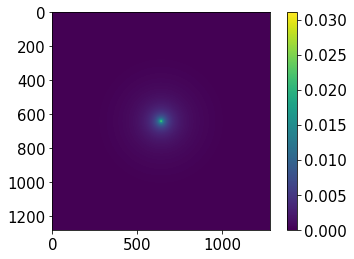

In [2]:
z_h=0.24
log_m=14.74
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)

halo =   halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
configName  =   '../../tests/test_halosim.ini'
parser      =   ConfigParser()
parser.read(configName)
gridInfo    =   cartesianGrid3D(parser)
yy,xx=np.meshgrid(gridInfo.ycgrid,gridInfo.xcgrid,indexing='ij')
haloSigma2=  halo.Sigma(xx.flatten()*3600.,yy.flatten()*3600.).reshape((gridInfo.ny,gridInfo.nx))
haloSigma2[gridInfo.ny//2,gridInfo.nx//2]=0.
norm= (np.sum(haloSigma2**2.))**0.5
haloSigma2=haloSigma2/norm
plt.imshow(haloSigma2)
plt.colorbar()

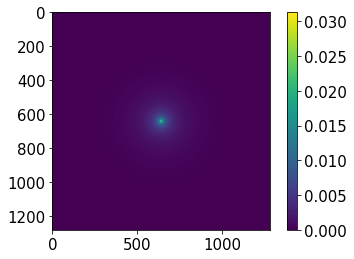

In [13]:
rpix=halo.rs_arcsec/gridInfo.delta/3600.
haloSigma1=np.fft.fftshift(halosim.haloCS02SigmaAtom(rpix,ny=gridInfo.ny,nx=gridInfo.nx,smooth_scale=-1,c=halo.c,fou=False))
haloSigma1[gridInfo.ny//2,gridInfo.nx//2]=0.
norm= (np.sum(haloSigma1**2.))**0.5
haloSigma1=haloSigma1/norm
vmax=haloSigma1.max()
plt.imshow(haloSigma1)
plt.colorbar()
assert np.max(np.abs(haloSigma1-haloSigma2))<vmax/100.

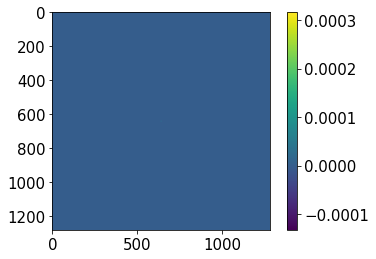

In [6]:
plt.imshow(haloSigma1-haloSigma2)
plt.colorbar()